In [ ]:
%cd ../

In [2]:
import logging
import numpy as np
import htfa_torch.htfa as HTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

/home/eli/anaconda3/envs/HTFATorch/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [3]:
from scipy.spatial import distance
from scipy import stats
import nilearn.plotting as niplot
import statsmodels.stats.multitest as smt

In [4]:
%matplotlib inline

In [5]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [6]:
haxby_db = niidb.FMriActivationsDb('data/haxby_mc_zrest.db')

In [7]:
htfa = HTFA.HierarchicalTopographicFactorAnalysis([b for b in haxby_db.all() if 'rest' not in b.task], mask='/home/eli/Documents/Haxby_Final/mask/haxby_mask.nii.gz', num_factors=100)

01/26/2020 15:14:00 Loading Nifti image /home/eli/Documents/Haxby_Final/sub1_run01_mc_MNI_masked.nii.gz with mask /home/eli/Documents/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/26/2020 15:14:01 Loading Nifti image /home/eli/Documents/Haxby_Final/sub1_run02_mc_MNI_masked.nii.gz with mask /home/eli/Documents/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/26/2020 15:14:02 Loading Nifti image /home/eli/Documents/Haxby_Final/sub1_run03_mc_MNI_masked.nii.gz with mask /home/eli/Documents/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/26/2020 15:14:03 Loading Nifti image /home/eli/Documents/Haxby_Final/sub1_run04_mc_MNI_masked.nii.gz with mask /home/eli/Documents/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/26/2020 15:14:04 Loading Nifti image /home/eli/Documents/Haxby_Final/sub1_run05_mc_MNI_masked.nii.gz with mask /home/eli/Documents/Haxby_Fina

In [8]:
htfa.num_parameters()

1436000

In [9]:
htfa.load_state('data/haxby_norest_k100_n1500_01252020_003420')

In [10]:
def task_labeler(b):
    return b.task

def rest_task_labeler(b):
    if b.task == 'rest':
        return 'Rest'
    else:
        return 'Task'

In [11]:
def subject_labeler(block):
    return 'Subject %d' % block.subject

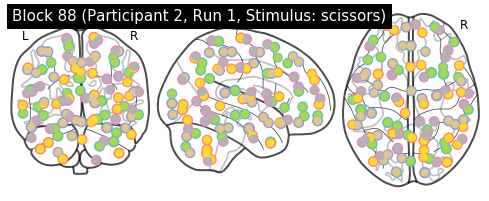

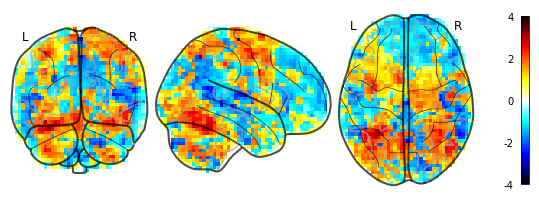

01/26/2020 15:15:22 Reconstruction Error (Frobenius Norm): 6.26240723e+02 out of 6.36484863e+02


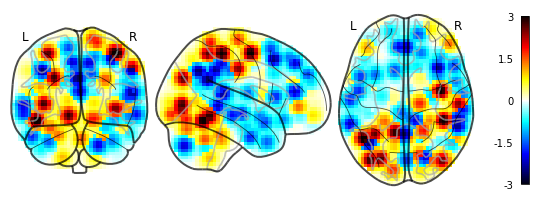

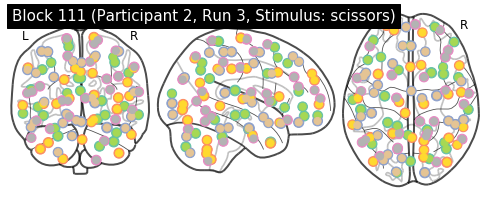

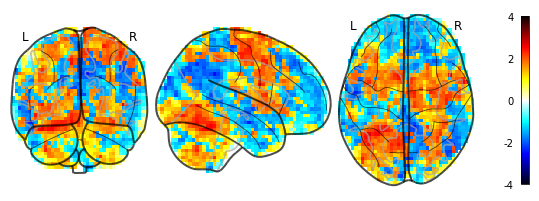

01/26/2020 15:15:25 Reconstruction Error (Frobenius Norm): 6.19206055e+02 out of 6.30872803e+02


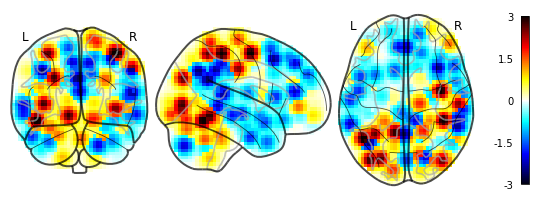

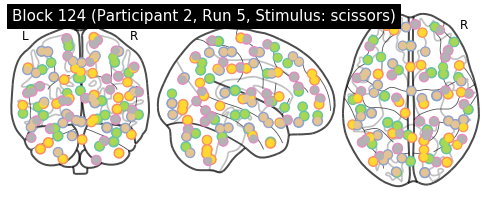

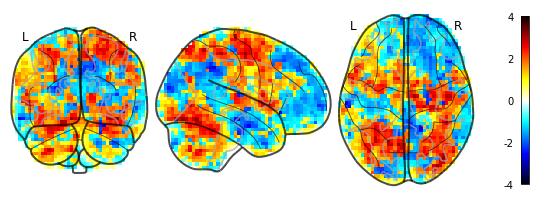

01/26/2020 15:15:28 Reconstruction Error (Frobenius Norm): 6.44174561e+02 out of 6.44300842e+02


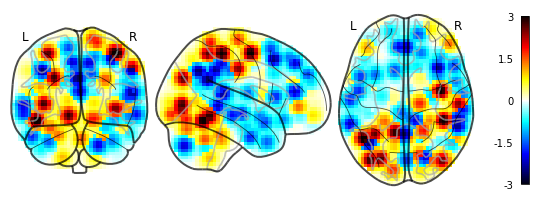

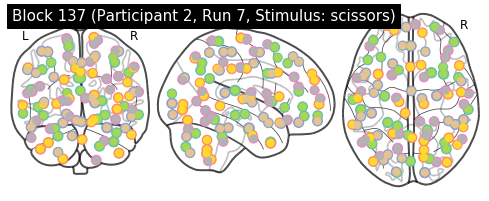

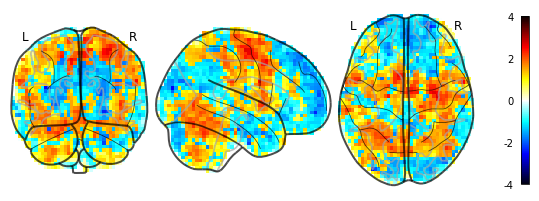

01/26/2020 15:15:31 Reconstruction Error (Frobenius Norm): 6.09613403e+02 out of 6.00198181e+02


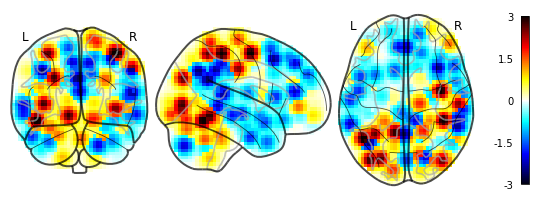

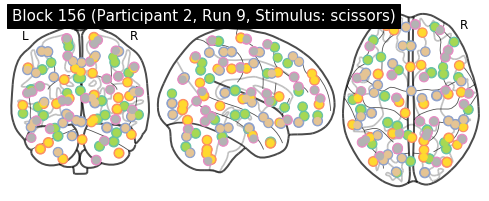

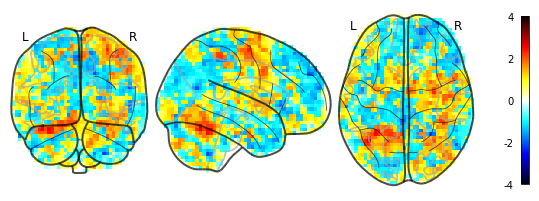

01/26/2020 15:15:34 Reconstruction Error (Frobenius Norm): 6.10266052e+02 out of 5.76843079e+02


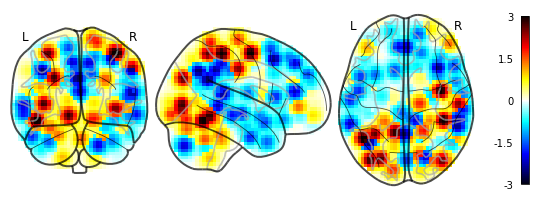

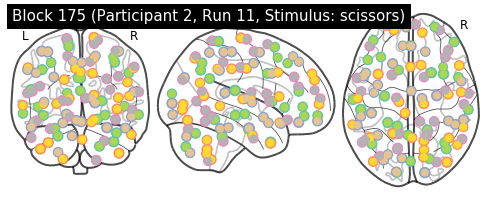

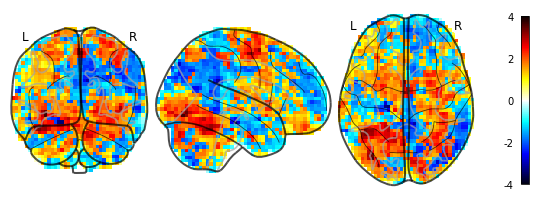

01/26/2020 15:15:37 Reconstruction Error (Frobenius Norm): 6.32684387e+02 out of 6.35086487e+02


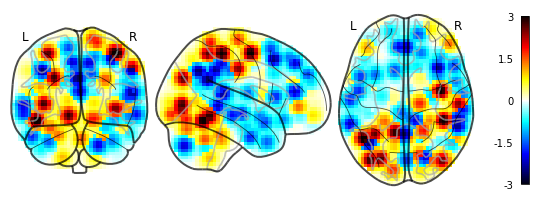

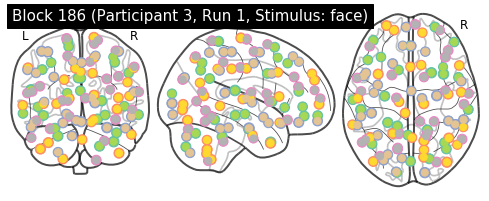

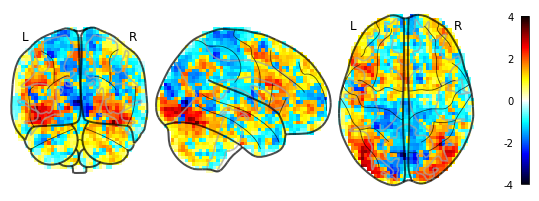

01/26/2020 15:15:40 Reconstruction Error (Frobenius Norm): 6.46716919e+02 out of 6.09614807e+02


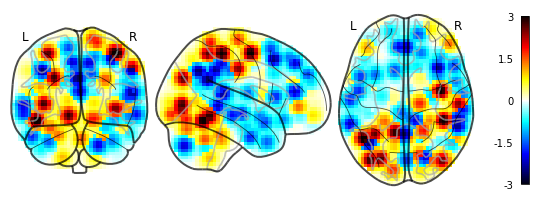

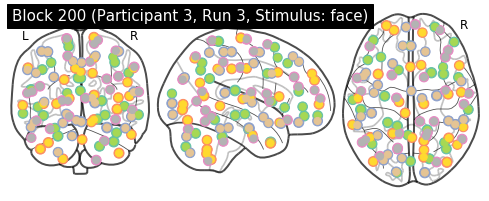

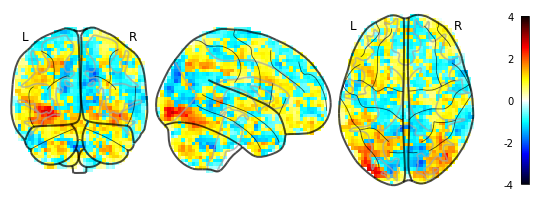

01/26/2020 15:15:43 Reconstruction Error (Frobenius Norm): 5.94830750e+02 out of 5.52729492e+02


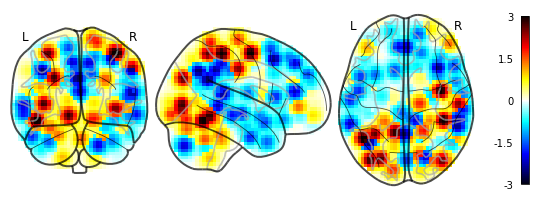

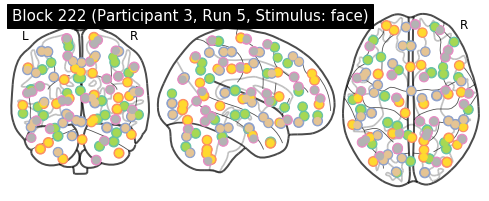

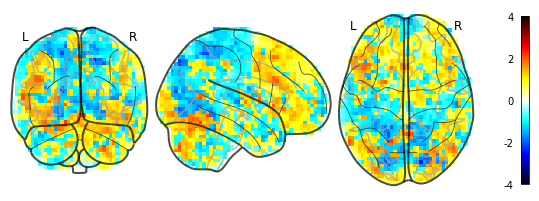

01/26/2020 15:15:46 Reconstruction Error (Frobenius Norm): 6.13510925e+02 out of 5.51140564e+02


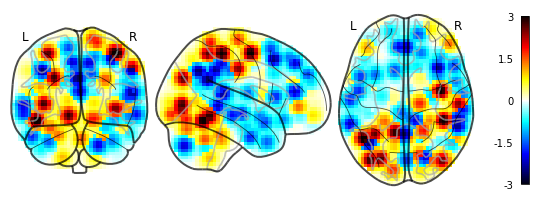

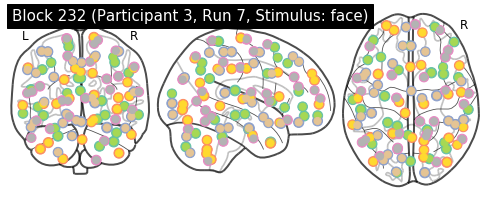

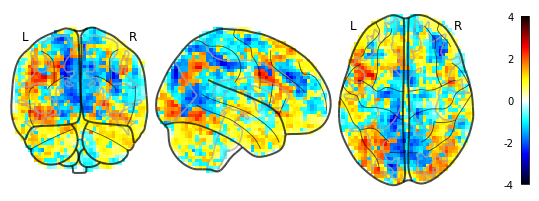

01/26/2020 15:15:49 Reconstruction Error (Frobenius Norm): 6.03196289e+02 out of 5.51951294e+02


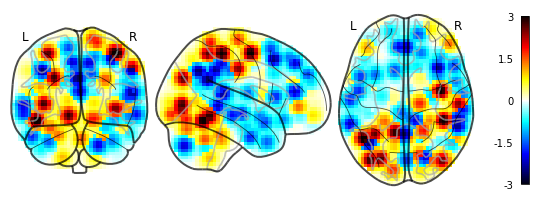

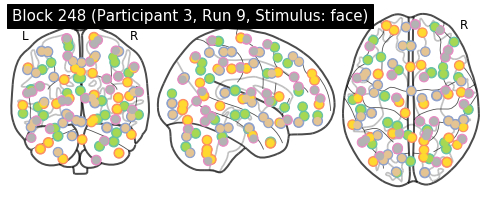

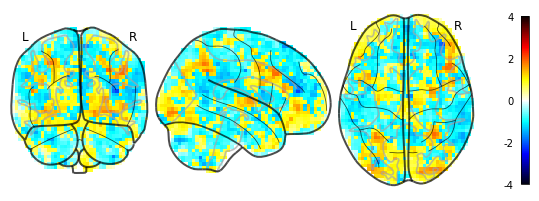

01/26/2020 15:15:52 Reconstruction Error (Frobenius Norm): 5.55470886e+02 out of 5.08276093e+02


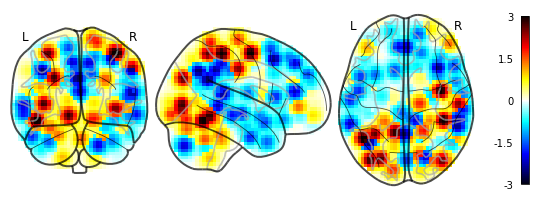

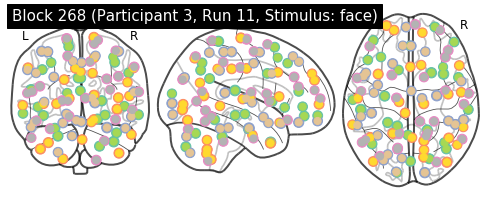

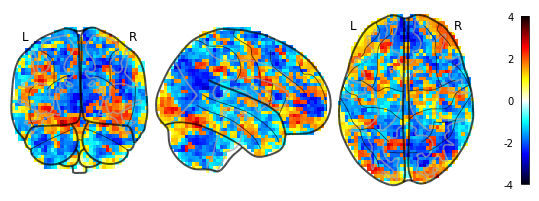

01/26/2020 15:15:54 Reconstruction Error (Frobenius Norm): 6.81202148e+02 out of 6.55966370e+02


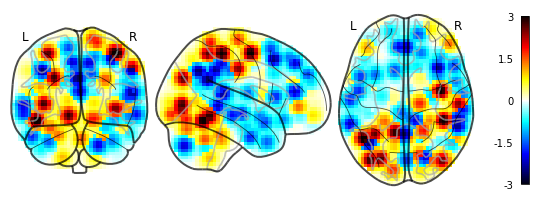

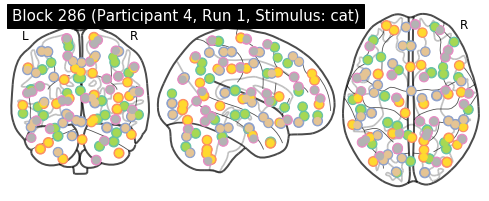

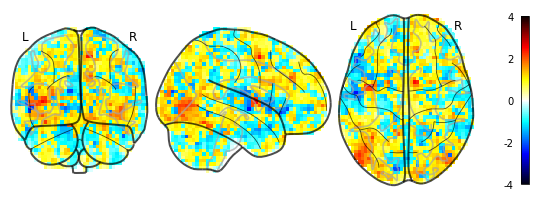

01/26/2020 15:15:57 Reconstruction Error (Frobenius Norm): 5.78435791e+02 out of 5.31463013e+02


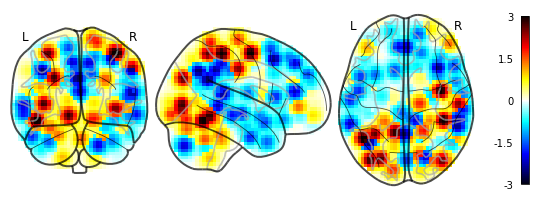

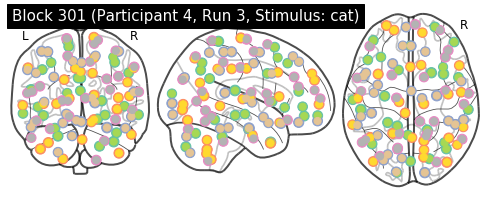

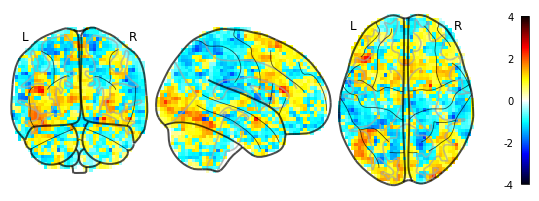

01/26/2020 15:16:00 Reconstruction Error (Frobenius Norm): 5.62468140e+02 out of 5.00539307e+02


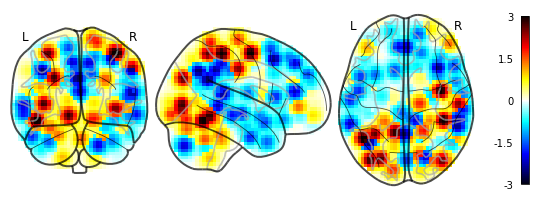

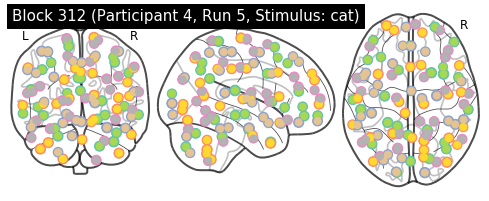

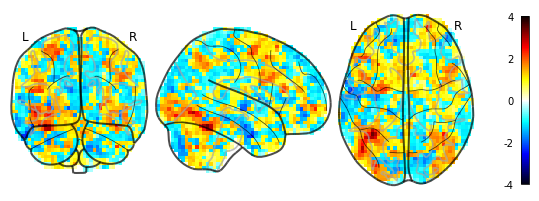

01/26/2020 15:16:03 Reconstruction Error (Frobenius Norm): 6.12306396e+02 out of 5.75106262e+02


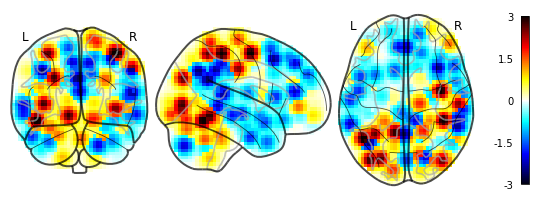

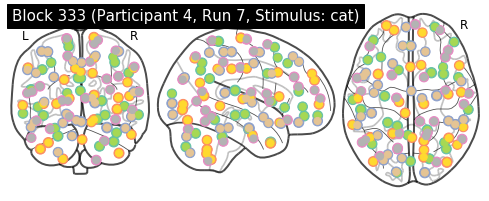

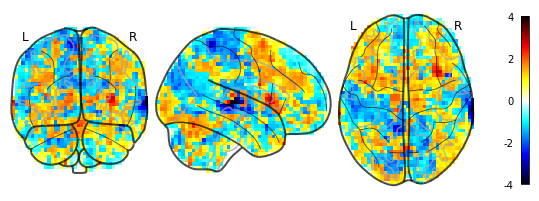

01/26/2020 15:16:06 Reconstruction Error (Frobenius Norm): 6.34222351e+02 out of 5.95553711e+02


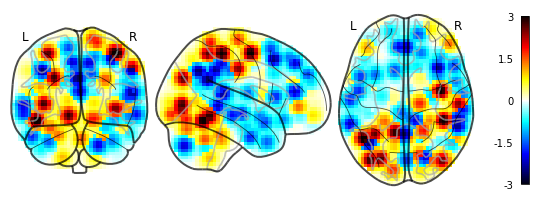

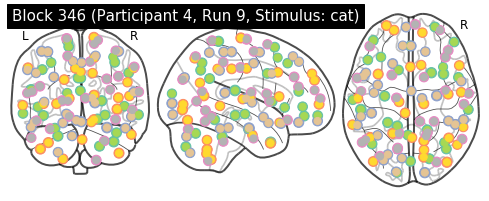

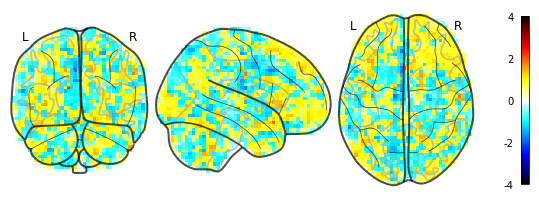

01/26/2020 15:16:09 Reconstruction Error (Frobenius Norm): 5.53884094e+02 out of 4.82947083e+02


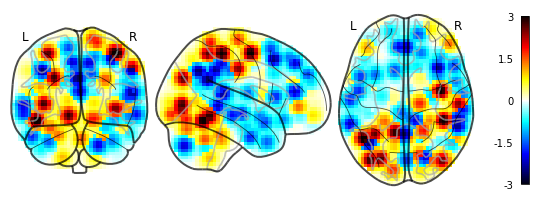

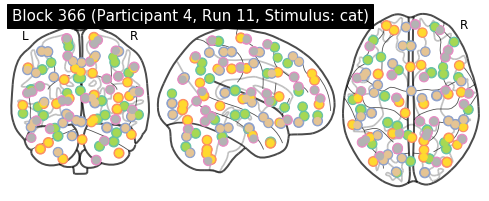

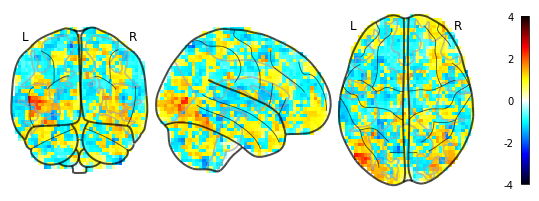

01/26/2020 15:16:11 Reconstruction Error (Frobenius Norm): 5.74423340e+02 out of 5.20422485e+02


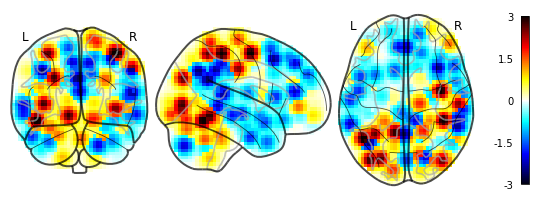

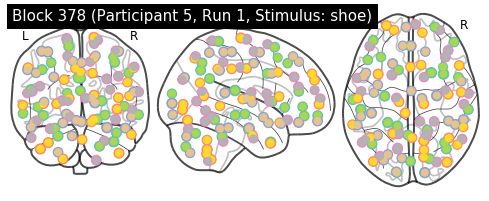

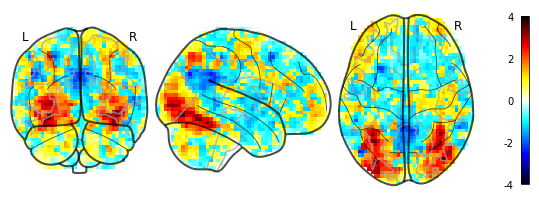

01/26/2020 15:16:14 Reconstruction Error (Frobenius Norm): 6.00924133e+02 out of 5.86504456e+02


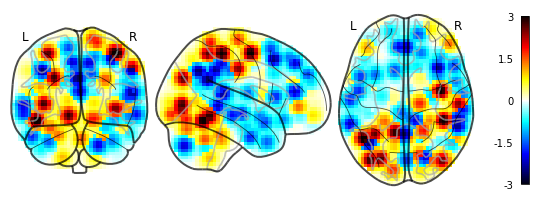

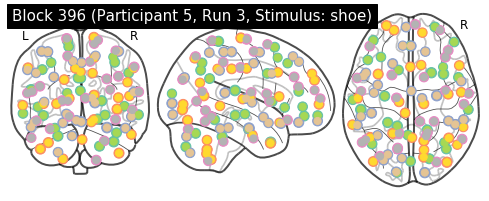

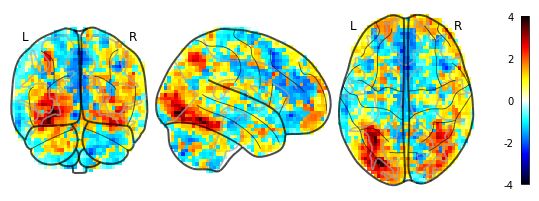

01/26/2020 15:16:17 Reconstruction Error (Frobenius Norm): 6.35020935e+02 out of 6.15271362e+02


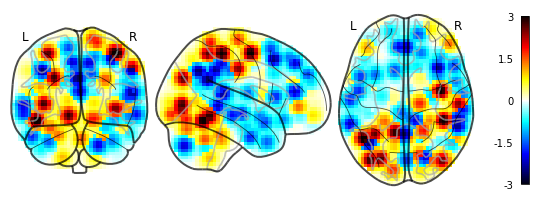

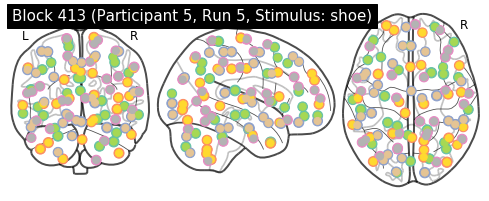

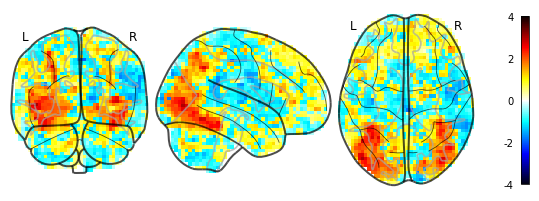

01/26/2020 15:16:20 Reconstruction Error (Frobenius Norm): 6.02527771e+02 out of 5.70584106e+02


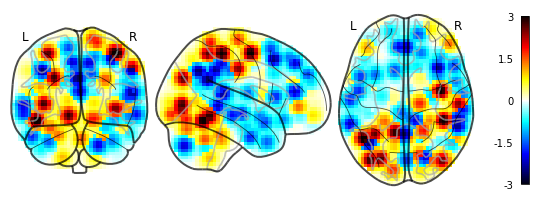

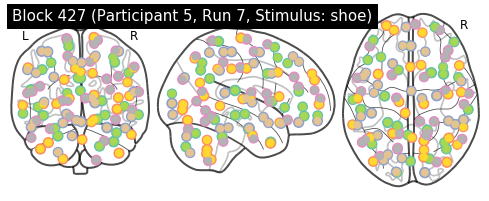

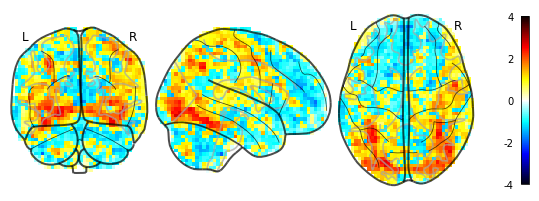

01/26/2020 15:16:23 Reconstruction Error (Frobenius Norm): 6.05910217e+02 out of 5.70172791e+02


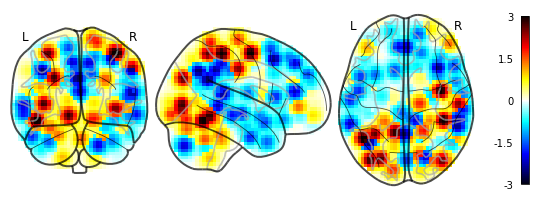

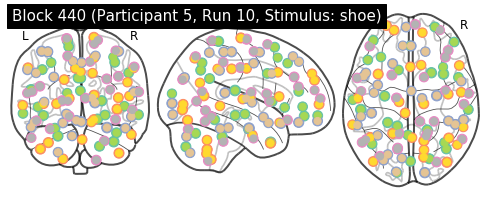

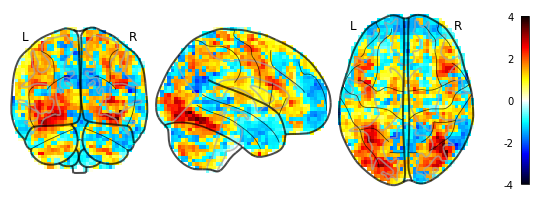

01/26/2020 15:16:26 Reconstruction Error (Frobenius Norm): 6.38437317e+02 out of 6.12698792e+02


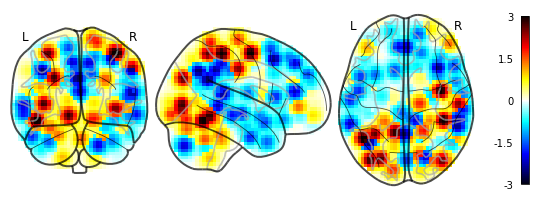

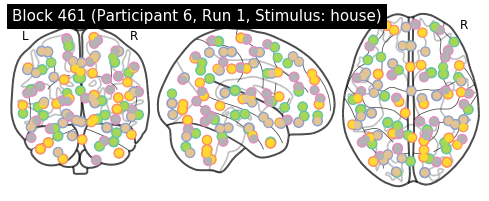

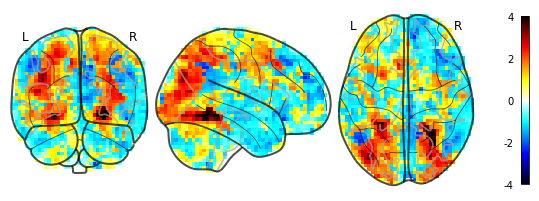

01/26/2020 15:16:28 Reconstruction Error (Frobenius Norm): 6.10280884e+02 out of 6.04306580e+02


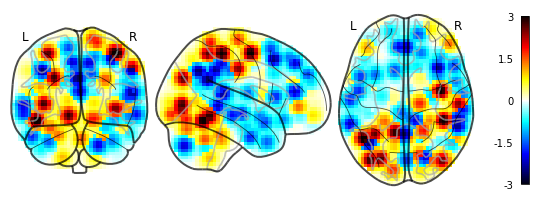

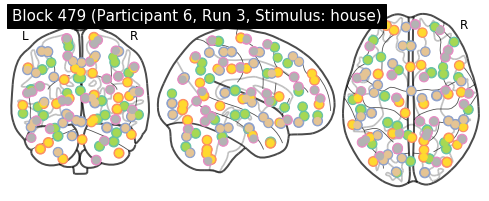

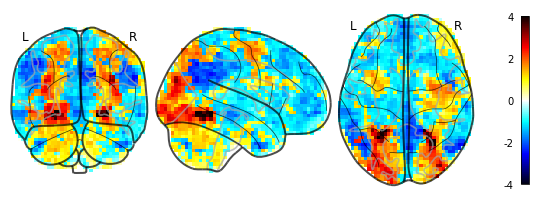

01/26/2020 15:16:31 Reconstruction Error (Frobenius Norm): 6.05801697e+02 out of 6.05236023e+02


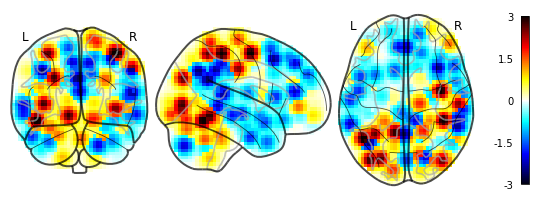

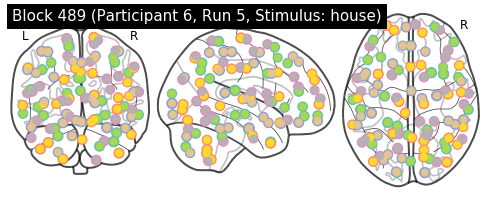

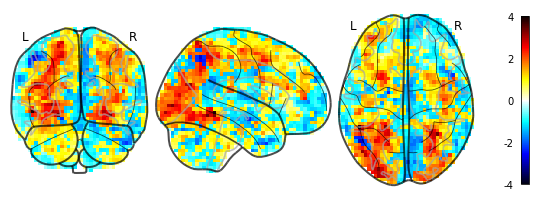

01/26/2020 15:16:34 Reconstruction Error (Frobenius Norm): 6.15966675e+02 out of 5.82021851e+02


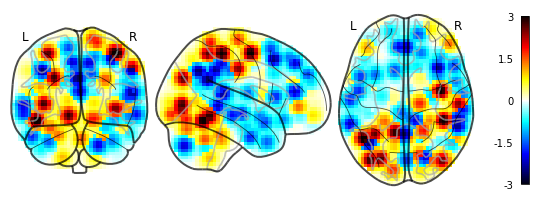

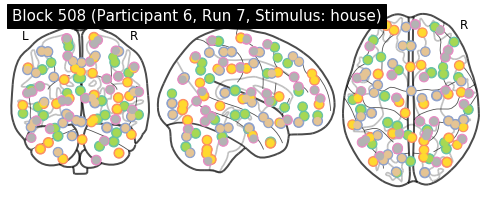

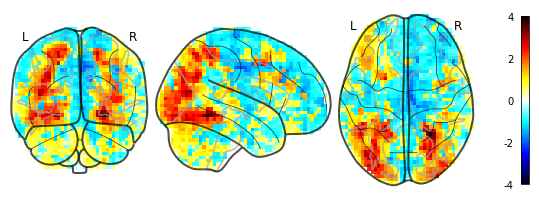

01/26/2020 15:16:37 Reconstruction Error (Frobenius Norm): 6.16068481e+02 out of 5.83054688e+02


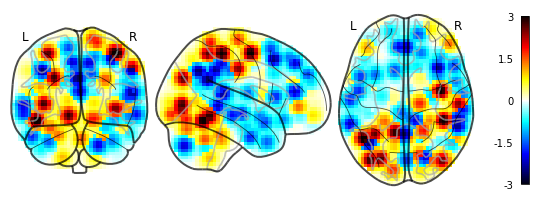

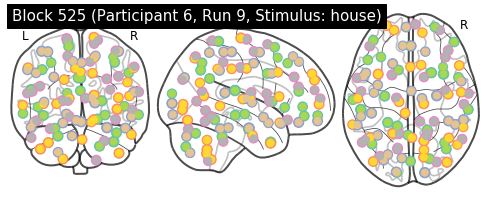

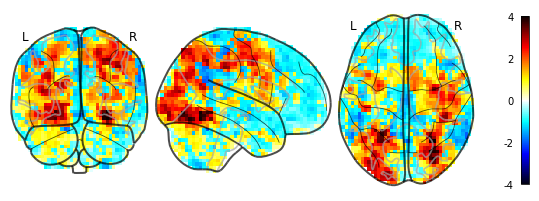

01/26/2020 15:16:40 Reconstruction Error (Frobenius Norm): 6.06913757e+02 out of 5.96572021e+02


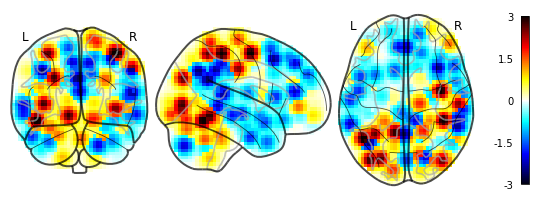

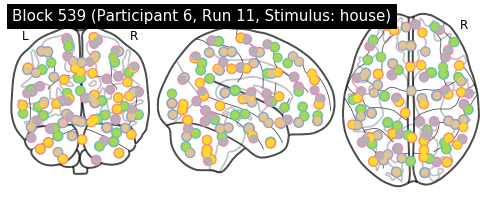

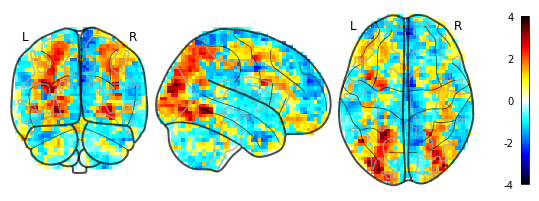

01/26/2020 15:16:43 Reconstruction Error (Frobenius Norm): 6.26938660e+02 out of 5.97426270e+02


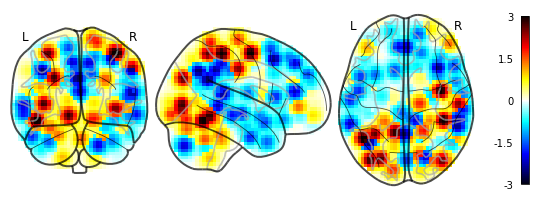

In [12]:
validation_filter = haxby_db.inference_filter(training=False)
validation_blocks = [b for (b, block) in enumerate(htfa._blocks) if validation_filter(block)]

for index in validation_blocks[0:-1:2]:
    htfa.plot_factor_centers(index)
    htfa.plot_original_brain(index, labeler=lambda b: None, zscore_bound=4., t=None)
    htfa.plot_reconstruction(index, labeler=lambda b: None, t=None)

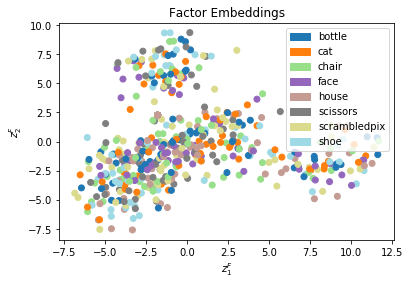

In [13]:
#factor 'embeddings' with PCA
htfa.scatter_factor_embedding(labeler=task_labeler,embedding='PCA')

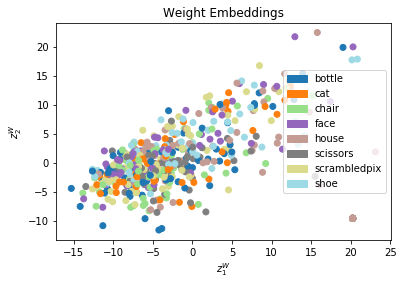

In [14]:
#weight 'embeddings' with PCA
htfa.scatter_weight_embedding(labeler=task_labeler,embedding='PCA')

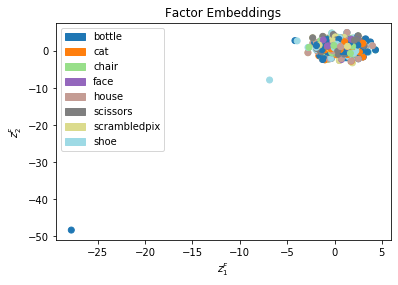

In [15]:
#factor 'embeddings' with TSNE
htfa.scatter_factor_embedding(labeler=task_labeler,embedding='TSNE')

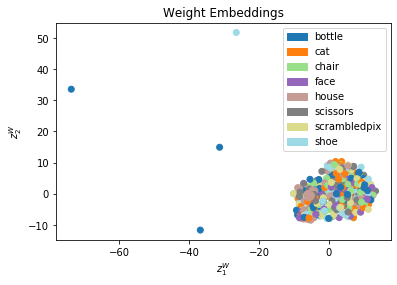

In [16]:
#weight 'embeddings' with TSNE
htfa.scatter_weight_embedding(labeler=task_labeler,embedding='TSNE')

In [17]:
htfa.average_reconstruction_error(weighted=False, blocks_filter=haxby_db.inference_filter(training=True))

01/26/2020 15:17:04 Average reconstruction error (MSE): 5.03311799e+02 +/- 3.63876742e+01
01/26/2020 15:17:04 Average data norm (Euclidean): 6.03396825e+02 +/- 6.17218783e+01
01/26/2020 15:17:04 Percent average reconstruction error: 83.713347 +/- 3.73130123e+00


(array([542.17437744, 525.56091309, 494.35931396, 501.65377808,
        513.74676514, 502.93463135, 508.02038574, 480.95074463,
        545.25305176, 521.86114502, 495.54779053, 450.01004028,
        467.33416748, 482.64624023, 545.18536377, 533.95892334,
        496.68185425, 489.86062622, 471.25091553, 499.02212524,
        481.40133667, 524.92614746, 493.3977356 , 500.07034302,
        601.40673828, 542.97515869, 497.62536621, 526.4855957 ,
        471.23794556, 506.13967896, 510.19039917, 474.55657959,
        567.86608887, 517.94549561, 467.41226196, 488.41030884,
        521.3081665 , 484.7578125 , 505.65045166, 531.20465088,
        580.16900635, 496.99969482, 499.44363403, 518.76483154,
        519.99578857, 508.94668579, 541.67193604, 485.81500244,
        519.58306885, 532.96466064, 484.47772217, 456.29370117,
        502.06680298, 540.52642822, 510.41955566, 539.01416016,
        454.38818359, 448.85372925, 466.4460144 , 447.57989502,
        464.10223389, 473.10131836, 430.

In [18]:
htfa.average_reconstruction_error(weighted=False, blocks_filter=haxby_db.inference_filter(training=False))

01/26/2020 15:17:06 Average reconstruction error (MSE): 6.24657113e+02 +/- 4.05955938e+01
01/26/2020 15:17:06 Average data norm (Euclidean): 5.96211312e+02 +/- 5.55892462e+01
01/26/2020 15:17:06 Percent average reconstruction error: 105.085789 +/- 4.15894405e+00


(array([626.24072266, 640.78521729, 619.20599365, 758.56469727,
        644.17456055, 620.93518066, 609.61334229, 725.92047119,
        610.26611328, 603.03381348, 632.68438721, 640.54510498,
        646.71691895, 688.69262695, 594.83074951, 610.94665527,
        613.51092529, 617.93762207, 603.1963501 , 659.26159668,
        555.47088623, 686.56121826, 681.20220947, 619.06976318,
        578.43585205, 580.87011719, 562.46813965, 595.27270508,
        612.30639648, 610.54547119, 634.22241211, 586.16088867,
        553.88409424, 575.22961426, 574.42333984, 568.61022949,
        600.9241333 , 642.14672852, 635.02093506, 693.33215332,
        602.527771  , 625.0559082 , 605.91021729, 600.18774414,
        638.43731689, 612.03417969, 610.28088379, 599.96325684,
        605.80169678, 631.91833496, 615.9666748 , 693.73480225,
        616.06848145, 653.16998291, 606.91375732, 690.63311768,
        626.93865967, 681.34942627]),
 array([636.48486328, 642.44049072, 630.87280273, 780.36627197,
  

In [19]:
htfa.free_energy(batch_size=15, use_cuda=True, blocks_batch_size=8, blocks_filter=haxby_db.inference_filter(training=True))

[[217265312.0, -205106432.0, 12158858.0],
 [217316416.0, -205063168.0, 12160541.0]]

In [20]:
htfa.free_energy(batch_size=15, use_cuda=True, blocks_batch_size=8, blocks_filter=haxby_db.inference_filter(training=False))

[[48306416.0, -46975960.0, 1330447.875], [49425088.0, -44236936.0, 1331046.5]]

In [21]:
from ordered_set import OrderedSet
subjects = OrderedSet([b.subject for b in htfa._blocks])

In [22]:
all_weights = htfa.enc.hyperparams.block__weights__mu.data.numpy()


In [23]:
### task classification using leave one out runs ###
from sklearn.svm import SVC
classifier = SVC(C=1., kernel="linear")

# A classifier to set the chance level
from sklearn.dummy import DummyClassifier
dummy_classifier = DummyClassifier()

# Make a data splitting object for cross validation
from sklearn.model_selection import LeaveOneGroupOut, cross_val_score
cv = LeaveOneGroupOut()

for s in subjects:
    print("Processing Subject %d" % (s))
    session_labels = []
    data = []
    targets = []
    for i in range(htfa.num_blocks):
        block = htfa._blocks[i]
        if block.subject == s:
            session_labels.append(block.run)
            data.append(all_weights[i,:,:].mean(0))
            targets.append(task_labeler(block))
    data = np.array(data)
    categories = np.unique(targets)

    for category in categories:
        print("Processing %s" % (category))
        classification_target = [t==category for t in targets]
        result = cross_val_score(
            classifier,
            data,
            classification_target,
            cv=cv,
            groups=session_labels,
#             scoring="roc_auc",
        )

        result_chance = cross_val_score(
            dummy_classifier,
            data,
            classification_target,
            cv=cv,
            groups=session_labels,
#             scoring="roc_auc",
        )

        print("Scores: %1.2f +- %1.2f" % (
            result.mean(),
            result.std()))

        print("Chance Scores: %1.2f +- %1.2f" % (
            result_chance.mean(),
            result_chance.std()))
        
    print ("\n")

Processing Subject 1
Processing bottle
Scores: 0.70 +- 0.24
Chance Scores: 0.80 +- 0.12
Processing cat
Scores: 0.86 +- 0.06
Chance Scores: 0.78 +- 0.12
Processing chair
Scores: 0.89 +- 0.06
Chance Scores: 0.76 +- 0.11
Processing face
Scores: 0.92 +- 0.08
Chance Scores: 0.73 +- 0.18
Processing house
Scores: 0.97 +- 0.06
Chance Scores: 0.82 +- 0.08
Processing scissors
Scores: 0.75 +- 0.11
Chance Scores: 0.77 +- 0.10
Processing scrambledpix
Scores: 0.89 +- 0.06
Chance Scores: 0.78 +- 0.08
Processing shoe
Scores: 0.85 +- 0.10
Chance Scores: 0.77 +- 0.09


Processing Subject 2
Processing bottle
Scores: 0.85 +- 0.11
Chance Scores: 0.77 +- 0.12
Processing cat
Scores: 0.83 +- 0.08
Chance Scores: 0.77 +- 0.12
Processing chair
Scores: 0.83 +- 0.08
Chance Scores: 0.78 +- 0.18
Processing face
Scores: 0.91 +- 0.12
Chance Scores: 0.81 +- 0.08
Processing house
Scores: 0.91 +- 0.09
Chance Scores: 0.78 +- 0.13
Processing scissors
Scores: 1.00 +- 0.00
Chance Scores: 0.82 +- 0.09
Processing scrambledpix


In [24]:
data = all_weights.mean(1)
targets = []
subject_labels = []
session_labels = []
for i in range(htfa.num_blocks):
    block = htfa._blocks[i]
    session_labels.append(block.run)
    targets.append(task_labeler(block))
    subject_labels.append(block.subject)
categories = np.unique(targets)
for category in categories:
    print("Processing %s" % (category))
    classification_target = [t==category for t in targets]
    result = cross_val_score(
        classifier,
        data,
        classification_target,
        cv=cv,
        groups=subject_labels,
#         scoring="roc_auc",
    )

    result_chance = cross_val_score(
        dummy_classifier,
        data,
        classification_target,
        cv=cv,
        groups=subject_labels,
#         scoring="roc_auc",
    )

    print("Scores: %1.2f +- %1.2f" % (
        result.mean(),
        result.std()))

    print("Chance Scores: %1.2f +- %1.2f" % (
        result_chance.mean(),
        result_chance.std()))

Processing bottle
Scores: 0.81 +- 0.06
Chance Scores: 0.79 +- 0.04
Processing cat
Scores: 0.78 +- 0.10
Chance Scores: 0.77 +- 0.03
Processing chair
Scores: 0.80 +- 0.07
Chance Scores: 0.79 +- 0.04
Processing face
Scores: 0.83 +- 0.02
Chance Scores: 0.81 +- 0.03
Processing house
Scores: 0.88 +- 0.04
Chance Scores: 0.79 +- 0.03
Processing scissors
Scores: 0.76 +- 0.08
Chance Scores: 0.78 +- 0.04
Processing scrambledpix
Scores: 0.80 +- 0.07
Chance Scores: 0.77 +- 0.02
Processing shoe
Scores: 0.79 +- 0.04
Chance Scores: 0.77 +- 0.03
